<a href="https://colab.research.google.com/github/manpreet1325/cap-comp215/blob/main/Final_Copy_of_Project_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from dataclasses import dataclass
import random
from matplotlib import rc
rc('animation', html='jshtml')  #to create animation, nothing else was working in colab



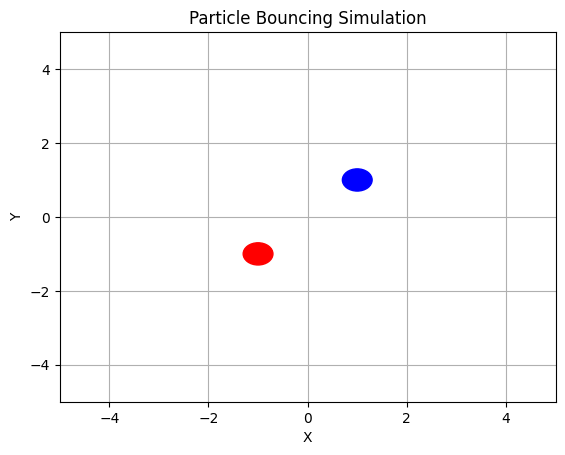

In [ ]:
#make a particle class
class Particle:
    def __init__(self, position, radius, color):
        self.position = position
        self.radius = radius
        self.color = color
        self.velocity = -1.9*position
        self.velocity /= np.linalg.norm(self.velocity)  # Normalize to unit vector by dividing by the magnitude of velocity vector

#This function iterates over a list of particle instances and updates their positions and velocities accordingly.
def update(frame):
        for particle in particles:
          displacement = np.multiply(particle.velocity, dt)
          particle.position = np.add(particle.position, displacement)



          # Checingk for collisions with walls. If collisions happen, change the direction of the motion of particle such that it is an elastic collision
          if particle.position[0] - particle.radius <= ax.get_xlim()[0] or particle.position[0] + particle.radius >= ax.get_xlim()[1]:
            particle.velocity[0] *= -1
          if particle.position[1] - particle.radius <= ax.get_ylim()[0] or particle.position[1] + particle.radius >= ax.get_ylim()[1]:
            particle.velocity[1] *= -1
            # Update particle position

          particle.circle.center = particle.position

        handle_collisions(particles)

        return [particle.circle for particle in particles]

def handle_collisions(particles):
    for i, particle in enumerate(particles):
        for other_particle in particles[i+1:]:
            distance = np.linalg.norm(particle.position - other_particle.position)
            if distance <= 2 * particle.radius:
                normal = (other_particle.position - particle.position) / distance
                particle.velocity = reflect(particle.velocity, normal)
                other_particle.velocity = reflect(other_particle.velocity, normal)

def reflect(velocity, normal):
    return velocity - 2 * np.dot(velocity, normal) * normal

        # Checking for collisions between particles
        # for other_particle in particles:
        #     if other_particle != particle:
        #         distance = np.linalg.norm(particle.position - other_particle.position)
        #         if distance <= 2 * particle.radius:
        #             normal = (other_particle.position - particle.position) / distance
        #             particle.velocity = particle.velocity - 2 * np.dot(particle.velocity, normal) * normal
        #             other_particle.velocity = other_particle.velocity - 2 * np.dot(other_particle.velocity, normal) * normal

        # Update particle position
    #particle.circle.center = particle.position

    #return [particle.circle for particle in particles]

# parameters
num_steps = 500
dt = 0.05
radius = 0.3

# Create the figure and axis
fig, ax = plt.subplots()
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)

# Create 2 particle instances
particle1 = Particle(np.array([1, 1]), radius, 'blue')
particle2 = Particle(np.array([-1, -1]), radius, 'red')

particles = [particle1, particle2]


for particle in particles:
    particle.circle = plt.Circle(particle.position, particle.radius, color=particle.color, fill=True)
    ax.add_patch(particle.circle)

# Function to initialize the animation
def init():
    for particle in particles:
        particle.circle.center = particle.position
    return [particle.circle for particle in particles]

# Finally, the animation
ani = FuncAnimation(fig, update, frames=num_steps, init_func=init, blit=True)

# Show the animation
plt.title("Particle Bouncing Simulation")
plt.xlabel("X")
plt.ylabel("Y")
plt.grid(True)
plt.show()
ani